In [1]:
from censai.models import VAE, VAESecondStage
from censai.utils import sampling_plot
import numpy as np
import tensorflow as tf
import os, glob
import json


In [4]:
model_prefixe = "VAE1_kappa_HPARAMS"
n_plots = 5
sampling_size = 81

VAE1_kappa_HPARAMS_018_L3_CL3_F32_NLbipolar_relu_LS64_ssi0.0_210811184904_second_stage_VAE2_kappa_HPARAMS_013_L3_LS32_U32_betaC1_210812231524
VAE1_kappa_HPARAMS_018_L3_CL3_F32_NLbipolar_relu_LS64_ssi0.0_210811184904_second_stage_VAE2_kappa_HPARAMS_012_L3_LS32_U32_betaC0_210812231524
VAE1_kappa_HPARAMS_018_L3_CL3_F32_NLbipolar_relu_LS64_ssi0.0_210811184904_second_stage_VAE2_kappa_HPARAMS_015_L3_LS32_U64_betaC1_210812232125
VAE1_kappa_HPARAMS_018_L3_CL3_F32_NLbipolar_relu_LS64_ssi0.0_210811184904_second_stage_VAE2_kappa_HPARAMS_010_L3_LS16_U64_betaC0_210812231524
VAE1_kappa_HPARAMS_018_L3_CL3_F32_NLbipolar_relu_LS64_ssi0.0_210811184904_second_stage_VAE2_kappa_HPARAMS_005_L2_LS32_U32_betaC1_210812230354


FileNotFoundError: [Errno 2] No such file or directory: '/home/aadam/scratch/Censai/models/VAE1_kappa_HPARAMS_018_L3_CL3_F32_NLbipolar_relu_LS64_ssi0.0_210811184904_second_stage_VAE2_kappa_HPARAMS_005_L2_LS32_U32_betaC1_210812230354/model_hparams.json'

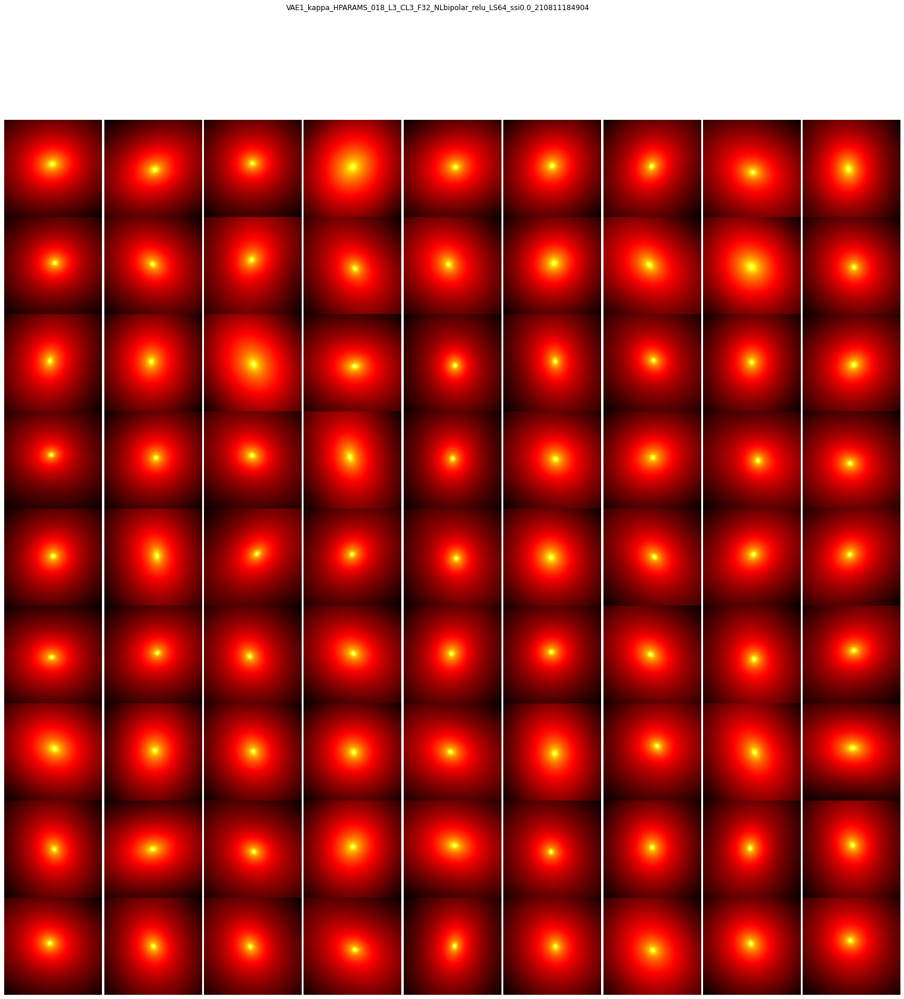

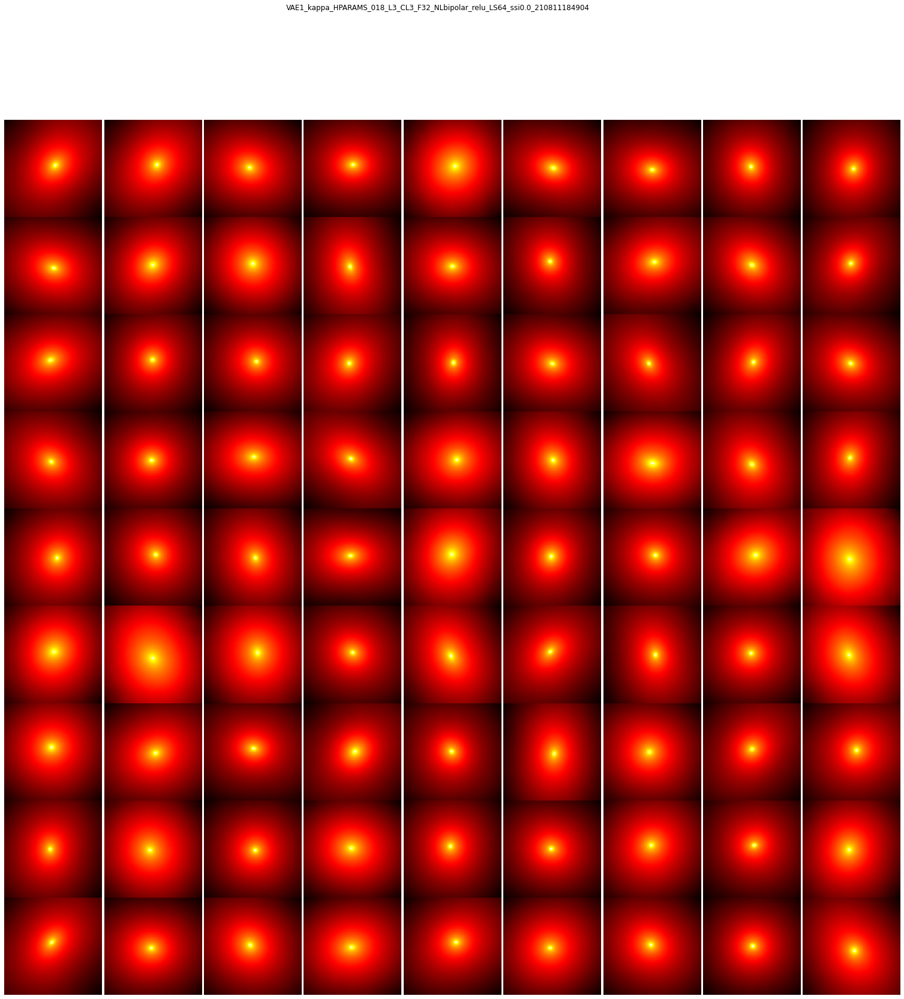

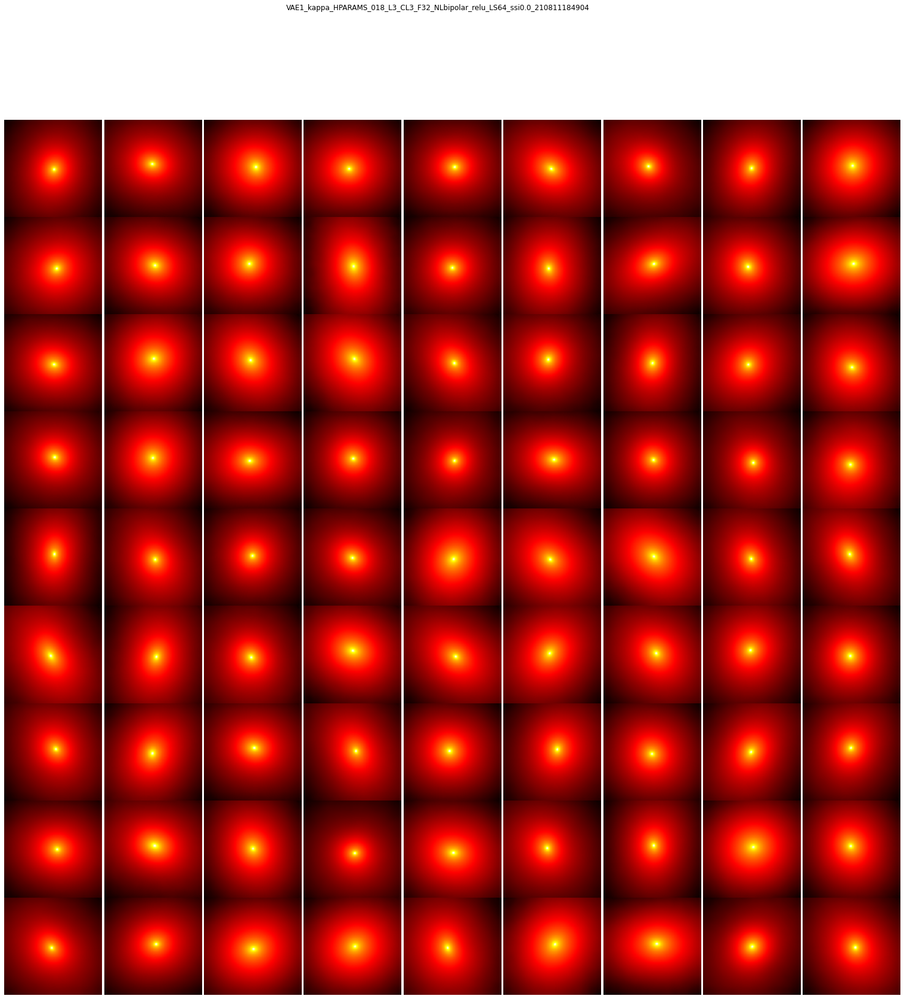

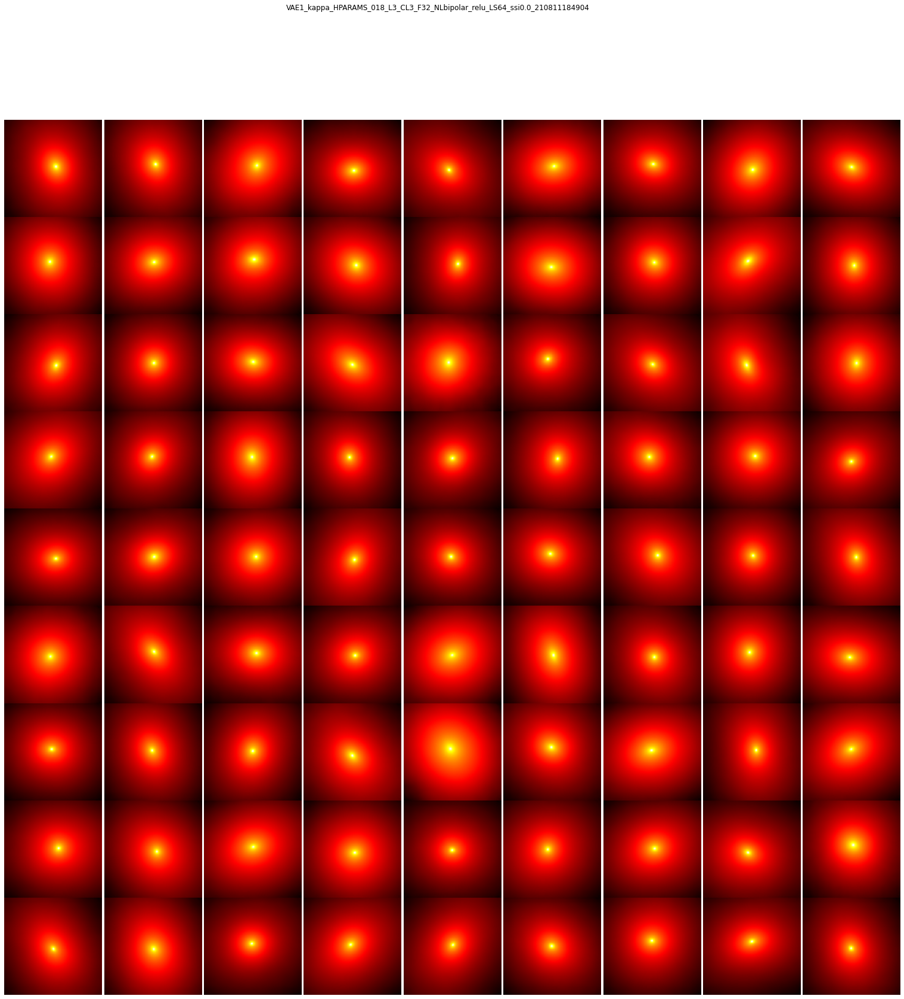

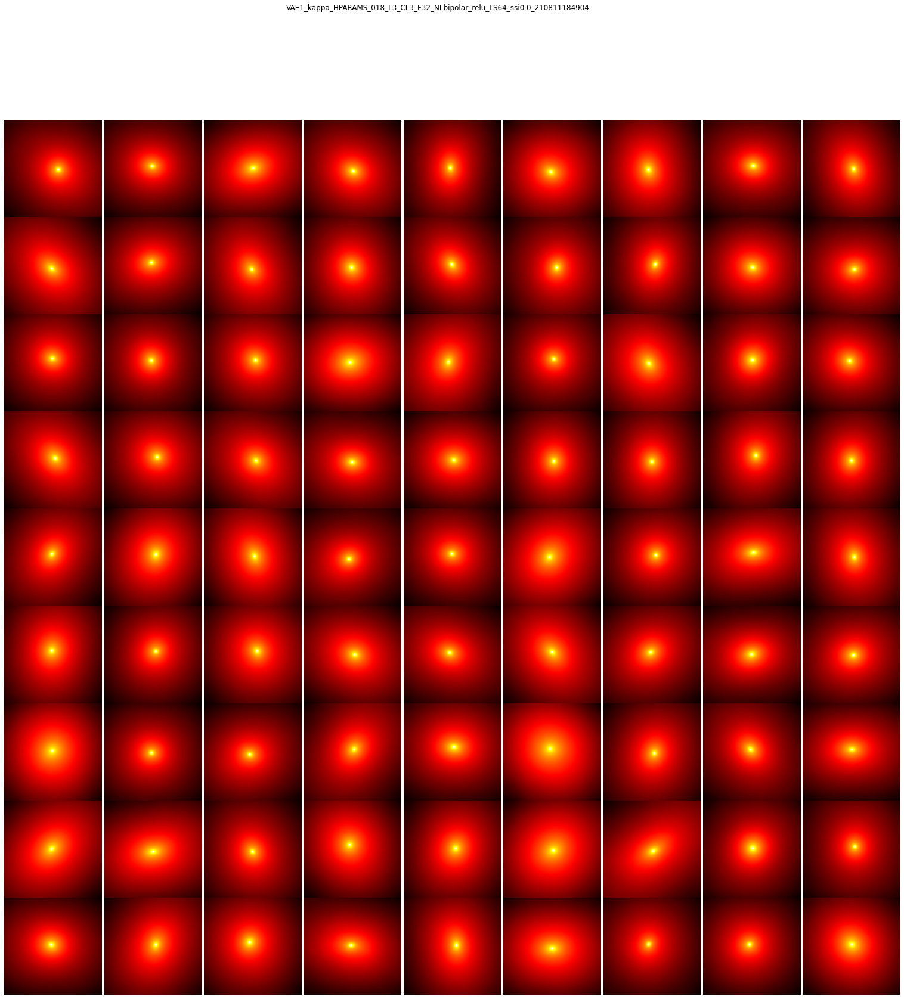

...

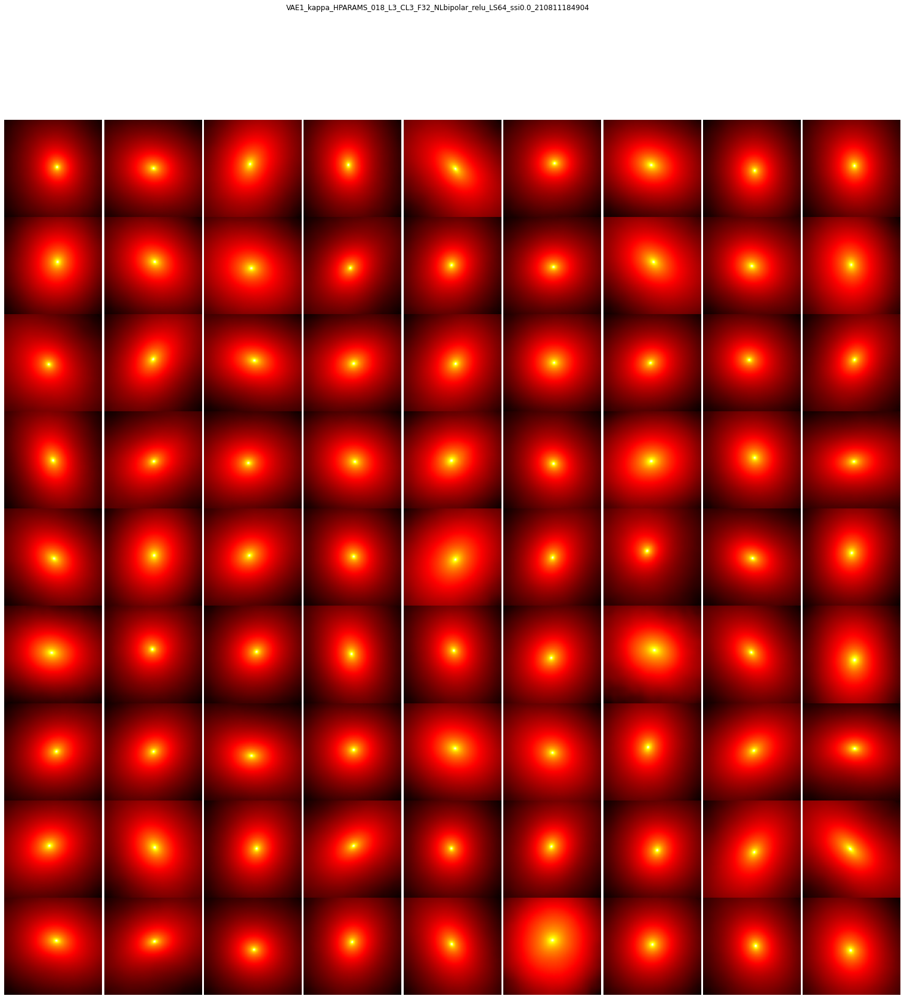

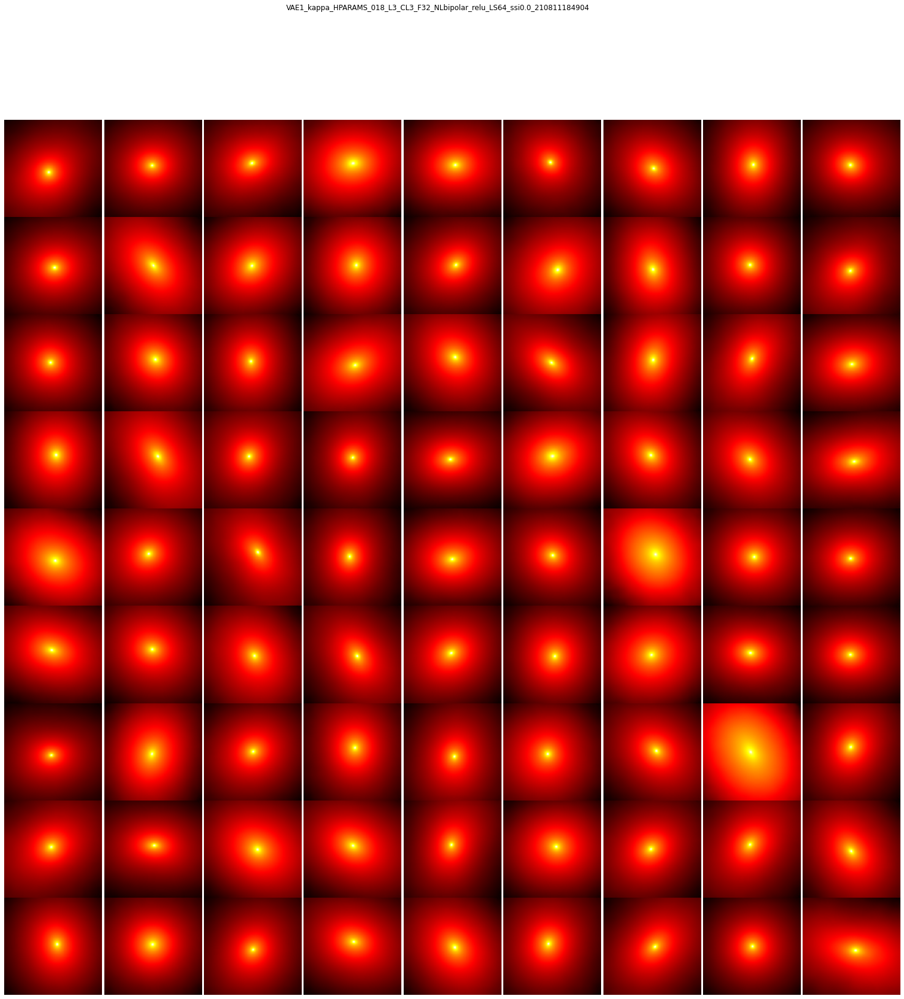

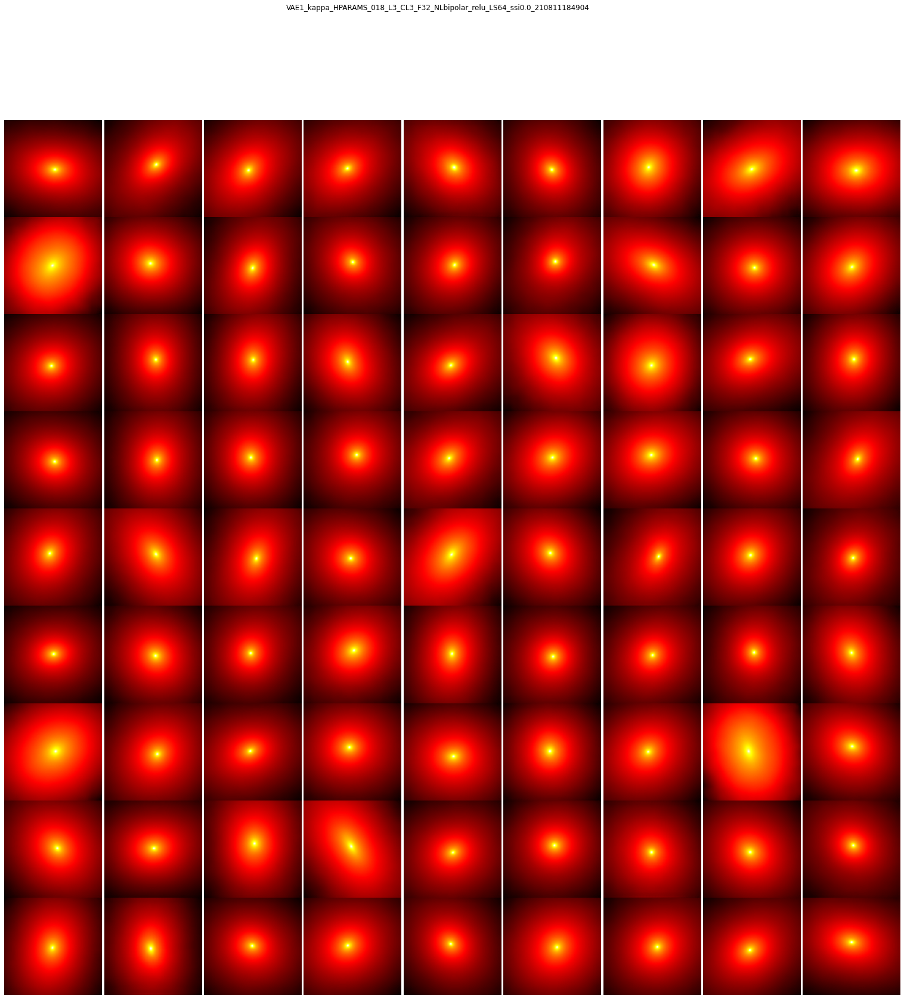

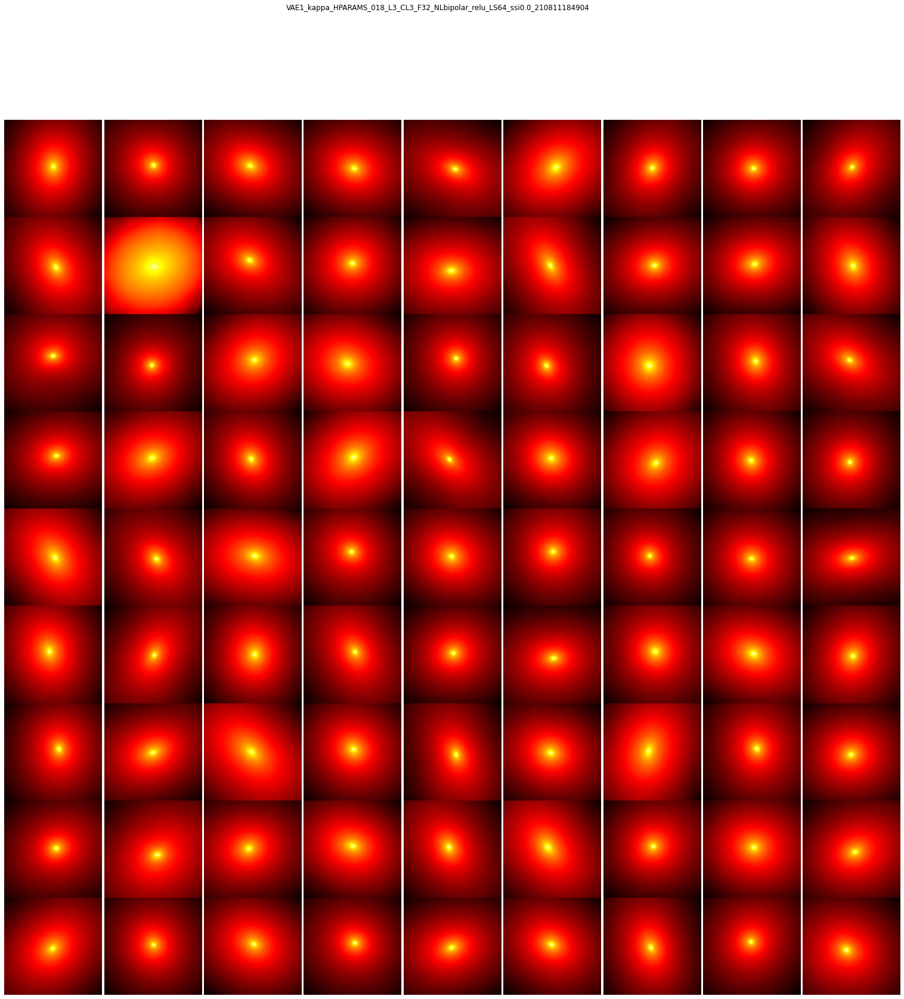

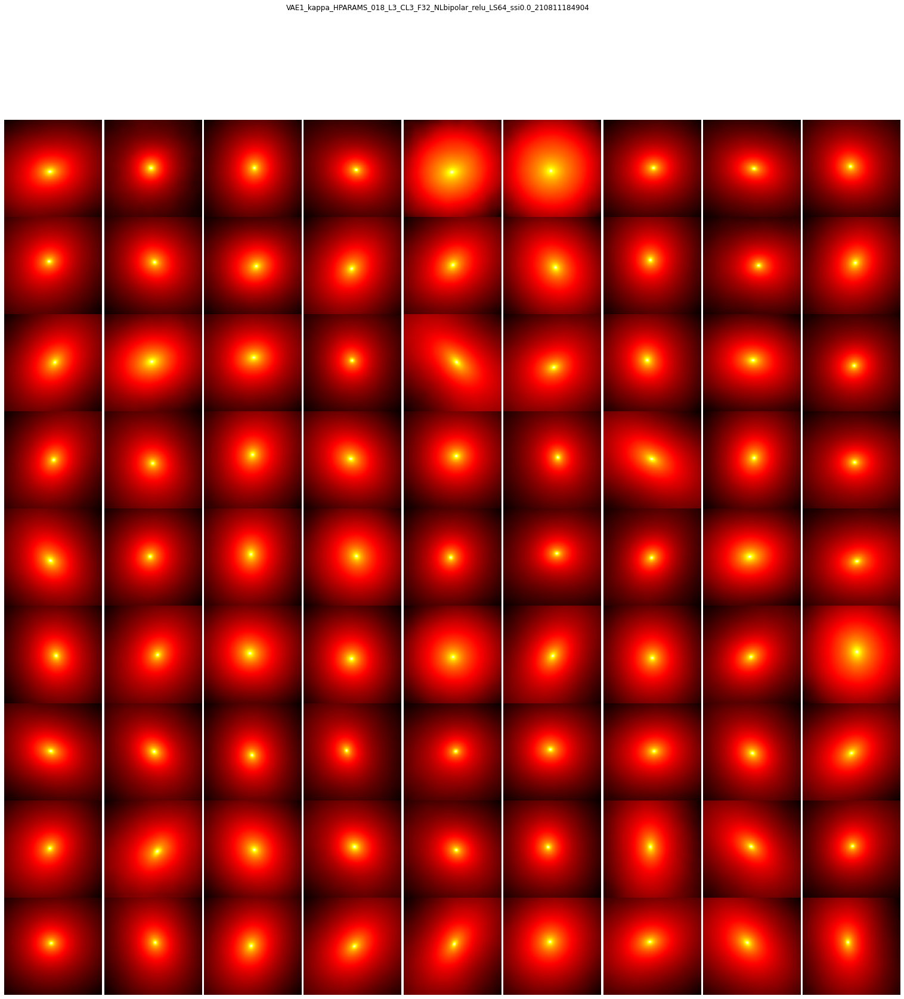

In [5]:
model_list = glob.glob(os.path.join(os.getenv("CENSAI_PATH"), "models", model_prefixe +"*"))
for model in model_list:
    if "second_stage" in model:
        continue
    with open(os.path.join(model, "model_hparams.json"), "r") as f:
        vae_hparams = json.load(f)

    # load weights of first stage
    vae = VAE(**vae_hparams)
    ckpt1 = tf.train.Checkpoint(net=vae)
    checkpoint_manager1 = tf.train.CheckpointManager(ckpt1, model, 1)
    checkpoint_manager1.checkpoint.restore(checkpoint_manager1.latest_checkpoint).expect_partial()

    model_name = os.path.split(model)[-1]
    second_stages = [file for file in model_list if "second_stage" in file and model_name in file]
    for second_stage in second_stages:
        second_stage_name = os.path.split(second_stage)[-1]
        print(second_stage_name)
        try:
            with open(os.path.join(second_stage, "model_hparams.json"), "r") as f:
                vae2_hparams = json.load(f)
        except FileNotFoundError:
            continue
        vae2 = VAESecondStage(**vae2_hparams)
        ckpt2 = tf.train.Checkpoint(net=vae2)
        checkpoint_manager2 = tf.train.CheckpointManager(ckpt2, second_stage, 1)
        checkpoint_manager2.checkpoint.restore(checkpoint_manager2.latest_checkpoint).expect_partial()

        for n in range(n_plots):
            z = vae2.sample(sampling_size)
            y_pred = vae.decode(z)
            fig = sampling_plot(y_pred)
            fig.suptitle(model_name)
            fig.savefig(os.path.join(os.getenv("CENSAI_PATH"), "results", "vae2_sampling_" + second_stage_name + f"_{n:02d}.png"))
plt.close()